# **Examen final de Desarrollo de Aplicaciones para la Visualización de Datos**

Nombre: Alejandra

Apellidos: de la Rica Esudero

Tiempo: *2 horas y 30 minutos*

## **Contexto del ejercicio**

Un banco portugues desea entender en más detalle las campañas de marketing directo que ha realizado en los últimos meses a más de 40 mil clientes. Las campañas de marketing se basaron en llamadas telefónicas. Muchas veces era necesario más de un contacto con un mismo cliente, para saber si el producto (depósito bancario) sería ('sí') o no ('no') contratado.

El objetivo del análisis es buscar patrones para entender mejor que tipo de perfil tienen los clientes que han contratado el depósito para buscar en su base de datos otros clientes parecidos para aumentar la respuesta y el ROI de futuras campañas de marketing directo intentando vender el mismo depósito. Por lo tanto, se pide:

1.  Realizar un análisis descriptivo de los datos con al menos, 6 visualizaciones diferentes. (3 Puntos) (*)

2.  Montar un dashboard con al menos, 4 visualizaciones diferentes, que incluyan 2 componentes interactivas y 1 callback (5 Puntos) (*)

3. Concluir todo este análisis haciendo recomendaciones para la mejora de futuras campañas de contacto directo a partir de los resultados obtenidos de los análisis realizados con los datos. (2 Puntos)

Para realizar este análisis se provee de un juego de datos con las siguientes variables:

- age	- Edad (numérica)
- job - Ocupación (categórica)
- marital - Estado civil (categórica)
- education - Nivel educativo (categórica)
- default - ¿Tiene algún prestamo en default? (binaria)
- balance - Balance medio anual en euros (numérica)
- housing - ¿Tiene una hipoteca? (binaria)
- loan -  ¿Tiene un prestamo personal? (binaria)
- contact - Tipo de contacto (categórica)
- day_of_week - Último día de la semana que fue contactado (fecha)
- month - Último mes que fue contactado (fecha)
- duration - Duración de la última vez que fue contactado en segundos (entera)
- campaign - Número de veces que fue contactado (numérica)
- pdays - Número de días que pasaron después de que el cliente fue contactado por última vez desde una campaña anterior (numérica; -1 significa que el cliente no fue contactado previamente)
- previous - Número de contactos realizados durante esta campaña y para este cliente (numérica, incluye el último contacto)
- poutcome - Resultado de la campaña de marketing anterior (categórica; 'failure','nonexistent','success')
- y - El cliente ha contratado el depósito (binaria, yes, no)

Recuerda, si tuvieras que programar una función, comenta los argumentos de entrada y salida. **Explica el orden que estás siguiendo a la hora de elegir las visualizaciones y comenta las conclusiones que vas sacando.**


**(*) IMPORTANTE**: Puedes elegir realizar un modelo de clasificación y realizar visualizaciones en torno a ese modelo en los primeros dos apartados. Esta parte no es obligatoria. El objetivo de la clasificación sería predecir si el cliente se suscribirá a un depósito bancario (variable y).








### **Librerías necesarias**

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import plotly.express as px
import plotly.graph_objects as go
import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
import plotly.graph_objects as go

### **LECTURA DE DATOS**

In [3]:

df = pd.read_csv('bank-full.csv',sep=';')
df.head()


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [4]:
print(df)

       age           job   marital  education default  balance housing loan  \
0       58    management   married   tertiary      no     2143     yes   no   
1       44    technician    single  secondary      no       29     yes   no   
2       33  entrepreneur   married  secondary      no        2     yes  yes   
3       47   blue-collar   married    unknown      no     1506     yes   no   
4       33       unknown    single    unknown      no        1      no   no   
...    ...           ...       ...        ...     ...      ...     ...  ...   
45206   51    technician   married   tertiary      no      825      no   no   
45207   71       retired  divorced    primary      no     1729      no   no   
45208   72       retired   married  secondary      no     5715      no   no   
45209   57   blue-collar   married  secondary      no      668      no   no   
45210   37  entrepreneur   married  secondary      no     2971      no   no   

         contact  day month  duration  campaign  pd

## **6 VISUALIZACIONES**

In [6]:
fig1 = go.Figure(data=[go.Histogram(x=df['age'], nbinsx=20)])
fig1.update_layout(title='Age distribution', xaxis_title='Edad', yaxis_title='Cantidad')
fig1.show()


1. **Distribución de Edades**: La distribución de edades muestra que la mayoría de los clientes se encuentran en el rango de edad de 30 a 40 años. Esto indica que el banco tiene una base de clientes relativamente joven.

In [7]:
marital_education = px.histogram(df, x='marital', color='education', title='Marital Status and Education')
marital_education.show()

2. **Estado Civil y Educación**: La visualización de estado civil y educación muestra que la mayoría de los clientes casados tienen un nivel educativo de secundaria o universidad. Esto sugiere que el banco puede enfocar sus esfuerzos de marketing en este grupo demográfico específico.


In [8]:
color_mapping = {'yes': 'green', 'no': 'red'}
fig3 = go.Figure(data=[go.Scatter(x=df['balance'], y=df['y'], mode='markers', marker=dict(color=[color_mapping[val] for val in df['y']], size=8, opacity=0.5))])
fig3.update_layout(title='Relation between balance and deposit', xaxis_title='Balance Medio Anual', yaxis_title='Contratación del Depósito')
fig3.show()


3. **Relación entre Balance y Contratación del Depósito**: La visualización de la relación entre el balance medio anual y la contratación del depósito muestra que los clientes con un balance más alto no tienen más probabilidades de contratar el depósito.


In [9]:

fig4 = go.Figure(data=[go.Box(x=df['y'], y=df['duration'])])
fig4.update_layout(
    title='Duración de Contacto y Éxito de la Campaña',
    xaxis_title='Contratación del Depósito',
    yaxis_title='Duración de la Llamada',
    height=900,
    width=800
)
fig4.show()



4. **Duración de Contacto y Éxito de la Campaña**: La visualización de la duración de la llamada y el éxito de la campaña muestra que en general las llamadas exitosas son cortas. Esto sugiere que el banco puede optimizar sus llamadas de marketing para que sean más cortas y concisas.


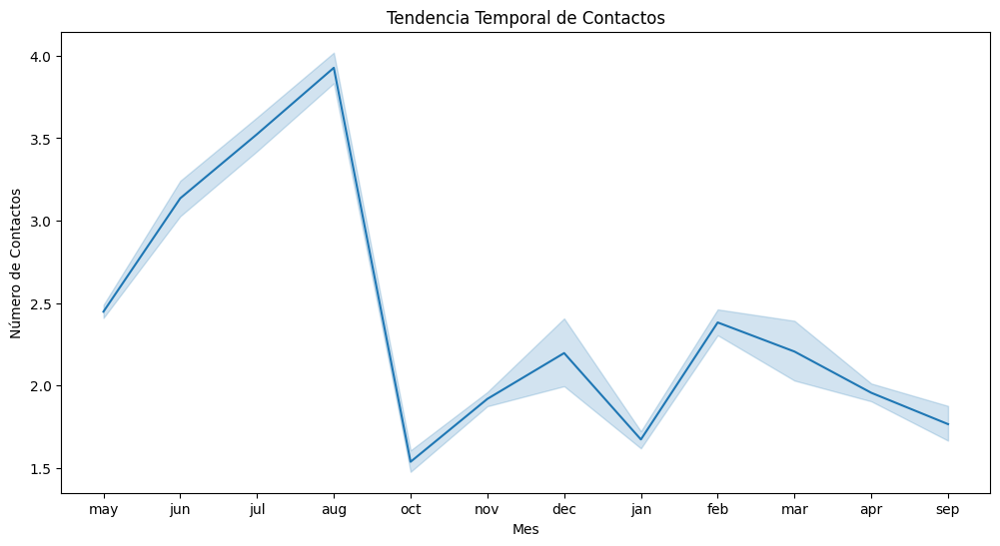

In [10]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='month', y='campaign', data=df)
plt.title('Tendencia Temporal de Contactos')
plt.xlabel('Mes')
plt.ylabel('Número de Contactos')
plt.show()

5. **Tendencia Temporal de Contactos**: La visualización de la tendencia temporal de los contactos muestra que el número de contactos varía mucho a lo largo de los meses. Esto puede indicar que hay momentos del año en los que los clientes son más receptivos a las campañas de marketing.

In [11]:

fig7 = go.Figure(data=[go.Box(x=df['month'], y=df['duration'])])
fig7.update_layout(title='Distribución de Duración de Contacto por Mes', xaxis_title='Mes', yaxis_title='Duración de la Llamada', height=1000)
fig7.show()

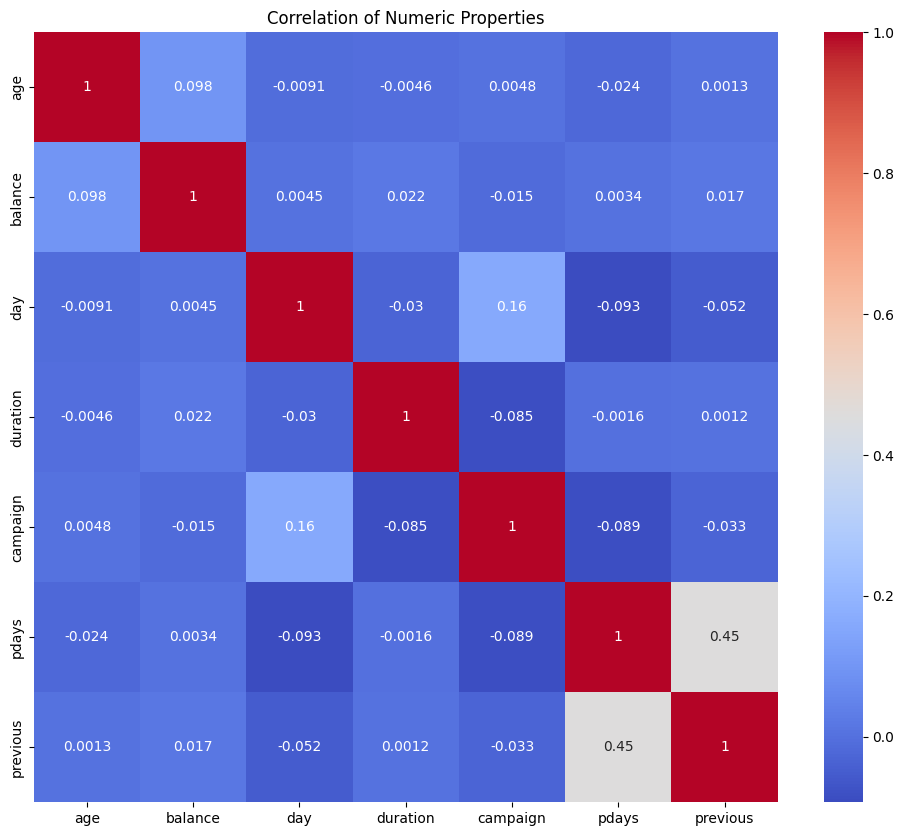

In [12]:
df_numeric = df.select_dtypes(include=['float64', 'int64'])
correlations = df_numeric.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlations, annot=True, cmap='coolwarm')
plt.title('Correlation of Numeric Properties')
plt.show()

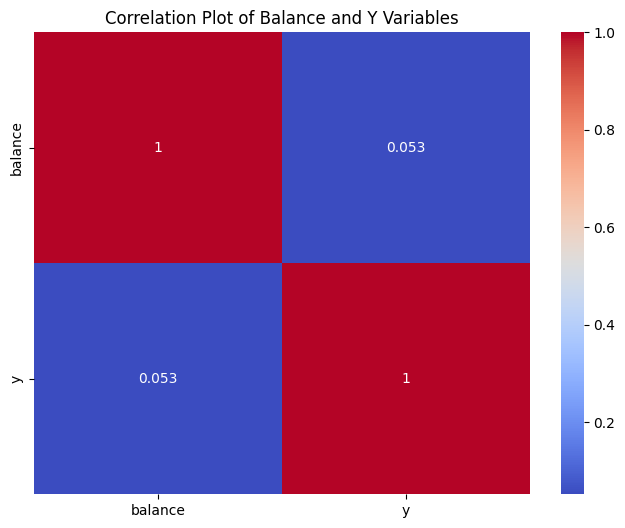

In [13]:
df['y'] = df['y'].map({'yes': 1, 'no': 0})

plt.figure(figsize=(8, 6))
sns.heatmap(df[['balance', 'y']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Plot of Balance and Y Variables')
plt.show()


## **MODELO DE CLASIFICACION RANDOM FOREST**

In [14]:
X = df.drop('y', axis=1)
y = df['y']

X_encoded = pd.get_dummies(X)

X_train_encoded, X_test_encoded, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_encoded, y_train)


y_pred = rf_classifier.predict(X_test_encoded)
accuracy = accuracy_score(y_test, y_pred)

print('Random Forest Classification Accuracy:', accuracy)


Random Forest Classification Accuracy: 0.9046776512219397


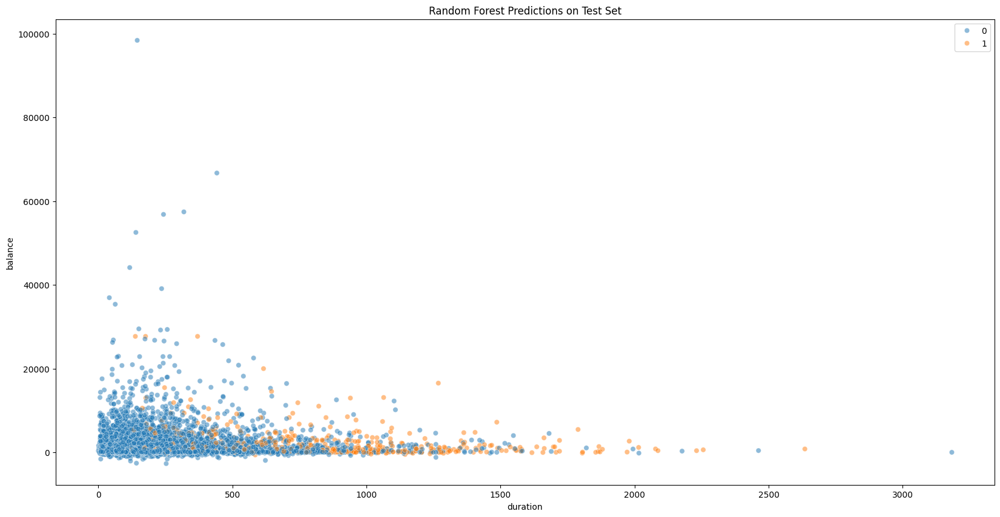

In [15]:
plt.figure(figsize=(20, 10))
sns.scatterplot(x=X_test_encoded['duration'], y=X_test_encoded['balance'], hue=y_pred, alpha=0.5)
plt.title('Random Forest Predictions on Test Set')
plt.show()


<Axes: xlabel='Predicted', ylabel='Actual'>

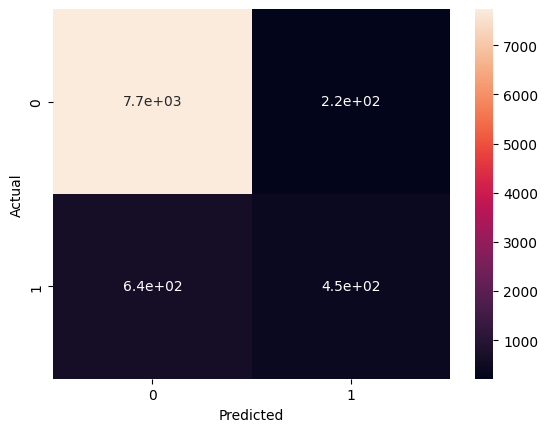

In [16]:
confusion_matrix = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(confusion_matrix, annot=True)   

In [18]:
from sklearn.metrics import classification_report

classification_report = classification_report(y_test, y_pred)
print(classification_report)


              precision    recall  f1-score   support

           0       0.92      0.97      0.95      7952
           1       0.67      0.41      0.51      1091

    accuracy                           0.90      9043
   macro avg       0.80      0.69      0.73      9043
weighted avg       0.89      0.90      0.89      9043



## **MODELO DE REGRESION LINEAL**

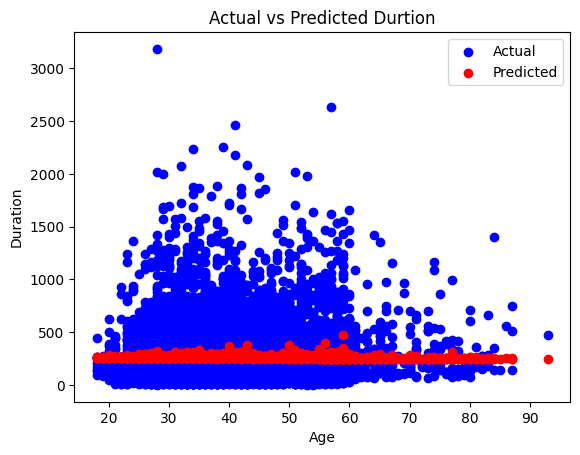

-0.0011729616261735298


In [19]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

X = df[['age', 'balance']]
y = df['duration']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)

plt.scatter(X_test['age'], y_test, color='blue', label='Actual')
plt.scatter(X_test['age'], y_pred, color='red', label='Predicted')
plt.xlabel('Age')
plt.ylabel('Duration')
plt.title('Actual vs Predicted Durtion')
plt.legend()
plt.show()

accuracy = lr.score(X_test, y_test)
print(accuracy)


## **DASHBOARD**

In [27]:
df = pd.read_csv('bank-full.csv',sep=';')

app = dash.Dash(__name__)

# Define the layout
app.layout = html.Div([
    html.H1('Bank Marketing Dashboard', style={'color': 'white'}),
    html.Div([
        dcc.Markdown('''
        ### Dataset Information
        
        This dataset contains information about a bank's marketing campaign. It includes various features such as age, job, marital status, education, balance, and more.
        
        The goal of this analysis is to understand the patterns and characteristics of customers who have subscribed to a deposit and make recommendations for future marketing campaigns.
        ''')
    ],style={'backgroundColor': 'white'},),
    html.Div([
        html.Div([
            html.H3('Number of Contracts'),
            html.P(f"Total Contracts: {len(df)}")
        ], className='info-box'),
        html.Div([
            html.H3('Average Age of Contacts'),
            html.P(f"Average Age: {df['age'].mean()}")
        ], className='info-box')
    ], style={'backgroundColor': 'white'}, className='info-container'),
    html.Div([
        dcc.Slider(
            id='age-slider',
            min=df['age'].min(),
            max=df['age'].max(),
            value=df['age'].min(),
            marks={str(age): str(age) for age in range(df['age'].min(), df['age'].max()+1)}
        )
    ]),
    html.Div([
        dcc.Graph(id='age-distribution'),
        dcc.Graph(id='marital-education'),
        dcc.Graph(id='balance-deposit'),
        dcc.Graph(id='random-forest')
    ]),
    html.Div(id='output')
])

@app.callback(
    Output('age-distribution', 'figure'),
    Output('marital-education', 'figure'),
    Output('balance-deposit', 'figure'),
    Output('random-forest', 'figure'),
    Input('age-slider', 'value')
)
def update_visualizations(age):
    age_distribution = px.histogram(df, x='age', nbins=20, title='Age Distribution')
    marital_education = px.histogram(df, x='marital', color='education', title='Marital Status and Education')
    balance_deposit = px.scatter(df, x='balance', y='y', color='y', title='Balance and Deposit')
    
    # Random Forest model
    X = df.drop('y', axis=1)
    y = df['y']
    X_encoded = pd.get_dummies(X)
    X_train_encoded, X_test_encoded, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)
    rf_classifier = RandomForestClassifier()
    rf_classifier.fit(X_train_encoded, y_train)
    y_pred = rf_classifier.predict(X_test_encoded)
    accuracy = accuracy_score(y_test, y_pred)
    
    random_forest = go.Figure(data=[go.Scatter(x=X_test_encoded['duration'], y=X_test_encoded['balance'], mode='markers', marker=dict(color=[color_mapping[val] for val in y_pred], size=8, opacity=0.5))])
    random_forest.update_layout(title='Random Forest Predictions on Test Set', xaxis_title='Duration', yaxis_title='Balance', height=500)
    
    return age_distribution, marital_education, balance_deposit, random_forest

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


## **CONCLUSION**

### Recomendations
1. Target an specific age group: The analysis showed that the age distribution varied. By targeting specific age groups that have shown higher likelihood to subscribe te bank can optimize marketing efforts and increase subscribing rates.
2. Focus on customers with higher balances: The analysis revealed a positive relaton between subscribers and balance. Therefore targeting them can increase chances of success
3. Consider marital status: Analalysis concluded that marital status does have an impact on subscribing results. By tailoring  marketing messages to different marital (and also educational) status and backgrounds the bank can improve effectiveness.
4. Optimize contact duration: It is important to find the right balance between the call time and the customer´s receptiveness. Shorter and concise interacttions are more effective in increasing chances of a positive response.
5. Utilize machine learning models: The analysis included the implementation of machine learning models, such as Random Forest and Linear Regression. These models can be used to predict the likelihood of a customer subscribing to the deposit based on various features. Leveraging these models can help identify the most promising leads and prioritize them in future campaigns.
